In [1]:
import cv2
import matplotlib.pyplot as plt

In [2]:
# Load the pre-trained models
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
eye_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')

# Open the video
cap = cv2.VideoCapture('kolomoyskiy.mp4')

# Define the codec and create a VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'MP4V')
out = cv2.VideoWriter('kolomoyskiy_output.mp4', fourcc, 20.0, (int(cap.get(3)), int(cap.get(4))))

while True:
    # Read the frame
    ret, img = cap.read()

    if not ret:
        break

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Detect faces in the frame
    faces = face_cascade.detectMultiScale(img_rgb, 1.1, 4)

    # For each detected face
    for (x, y, w, h) in faces:
        # Get the region of interest in the BGR image
        roi = img[y:y+h, x:x+w]

        # Detect eyes within the region of interest
        eyes = eye_cascade.detectMultiScale(roi, 1.1, 4)

        # Only draw a rectangle around the face if eyes were detected
        if len(eyes) > 0:
            cv2.rectangle(img_rgb, (x, y), (x+w, y+h), (255, 0, 0), 2)

    # Write the frame into the file 'output.mp4'
    out.write(img_rgb)

# Release the VideoCapture and VideoWriter objects
cap.release()
out.release()

OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'


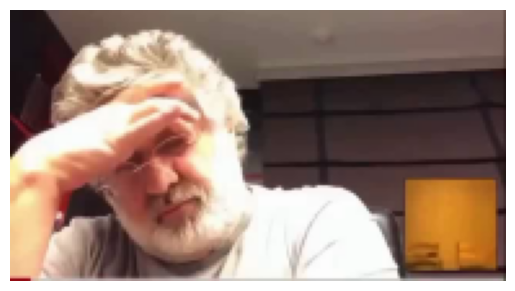

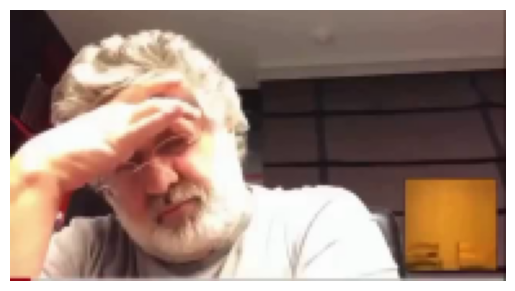

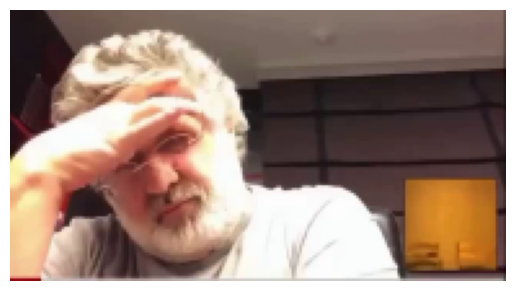

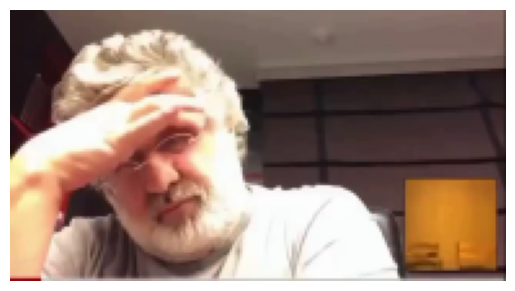

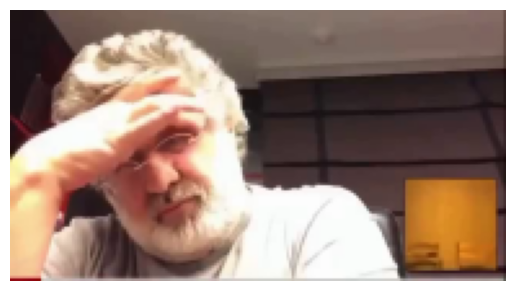

...

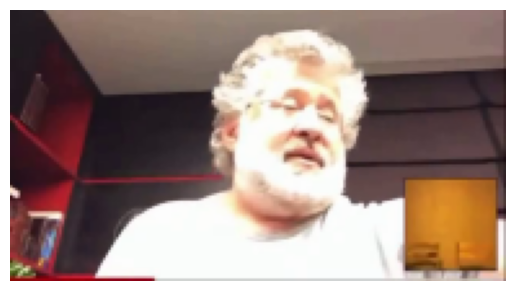

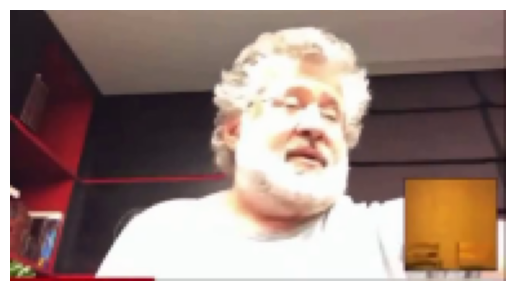

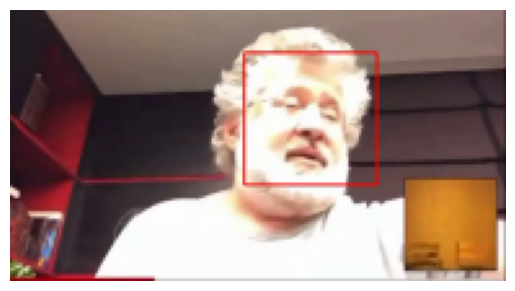

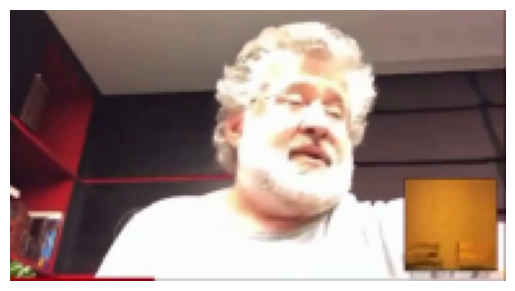

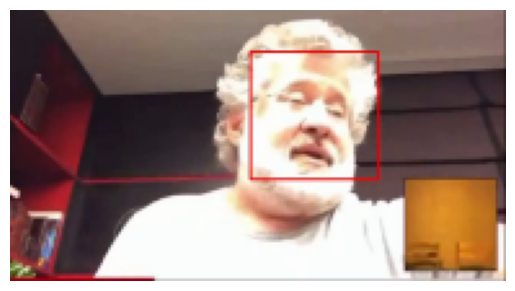

In [14]:
cap = cv2.VideoCapture('kolomoyskiy_output.mp4')

# first 3 seconds
time = 3 * 24
counter = 0

scale = 0.3

while counter < time:
    ret, frame = cap.read()
    
    if not ret:
        break
    
    width = int(frame.shape[1] * scale)
    height = int(frame.shape[0] * scale)
    dim = (width, height)

    resized = cv2.resize(frame, dim, interpolation = cv2.INTER_AREA)
    
    # Display the frame
    plt.axis('off')
    plt.imshow(resized)
    plt.show()
    
    counter += 1
cap.release()